<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Linear-Regression-(Module-1)-Project:-King-Country-Real-Estate-Prices" data-toc-modified-id="Linear-Regression-(Module-1)-Project:-King-Country-Real-Estate-Prices-1">Linear Regression (Module 1) Project: King Country Real Estate Prices</a></span></li><li><span><a href="#Dataset" data-toc-modified-id="Dataset-2">Dataset</a></span></li><li><span><a href="#Exploratory-Data-Analysis" data-toc-modified-id="Exploratory-Data-Analysis-3">Exploratory Data Analysis</a></span><ul class="toc-item"><li><span><a href="#yr_sold,-yr_built,-yr_renovated" data-toc-modified-id="yr_sold,-yr_built,-yr_renovated-3.1">yr_sold, yr_built, yr_renovated</a></span></li><li><span><a href="#zipcode,-lat,-long" data-toc-modified-id="zipcode,-lat,-long-3.2">zipcode, lat, long</a></span></li><li><span><a href="#bedrooms" data-toc-modified-id="bedrooms-3.3">bedrooms</a></span></li><li><span><a href="#bathrooms" data-toc-modified-id="bathrooms-3.4">bathrooms</a></span></li><li><span><a href="#sqft_living,-sqft_above,-sqft_basement,-floors" data-toc-modified-id="sqft_living,-sqft_above,-sqft_basement,-floors-3.5">sqft_living, sqft_above, sqft_basement, floors</a></span></li><li><span><a href="#sqft_lot" data-toc-modified-id="sqft_lot-3.6">sqft_lot</a></span></li><li><span><a href="#waterfront" data-toc-modified-id="waterfront-3.7">waterfront</a></span></li><li><span><a href="#view" data-toc-modified-id="view-3.8">view</a></span></li><li><span><a href="#condition,-grade" data-toc-modified-id="condition,-grade-3.9">condition, grade</a></span></li><li><span><a href="#sqft_living15,-sqft_lot15" data-toc-modified-id="sqft_living15,-sqft_lot15-3.10">sqft_living15, sqft_lot15</a></span></li></ul></li></ul></div>

##### Required libraries and modules:

In [1]:
import pandas as pd
import pandas_profiling

pd.set_option("display.max_columns", None)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_colwidth', -1)

import numpy as np

%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("white")
sns.set_context("paper", font_scale=1.8)
sns.set_palette("GnBu_d")

import folium
from folium.plugins import MarkerCluster, HeatMap

from sklearn.linear_model import LinearRegression
from statsmodels.formula.api import ols
import statsmodels.api as sm

import warnings
warnings.filterwarnings('ignore')

import requests
from bs4 import BeautifulSoup
import re
from random import randint
from time import sleep

import pickle

In [157]:
import preprocess as pre
%reload_ext autoreload
%autoreload 2

# Linear Regression (Module 1) Project: King Country Real Estate Prices

In this project, we have been tasked to build a model that predicts the property prices in King County. The final model should include 3 features only.  The following will be addressed as well through data exploration:

* Which area have the most expensive properties?
* What are the factors that significantly affect the price?
* Is it worth upgrading the improvement to resell a property at a higher price?
* What years properties have lasted the best?

Topics covered: Regression, Pandas, Data Visualisation, Web-Scraping

# Dataset
*Note: The dataset has been modified by our instructors for this project.*

The dataset consists of 21597 property listings in King County sold between 2014 and 2015.  Each listing has the following information:

* **id** - unique identified for the property
* **date** - date property was sold
* **price** -  property selling price
* **bedrooms** -  no. of bedrooms
* **bathrooms** -  no of bathrooms
* **sqft_living** -  square footage of the improvement
* **sqft_lot** -  lot area in sqft.
* **floors** -  no. of floor levels
* **waterfront** - 1 has waterfront view, 0 none
* **view** - no. of views
* **condition** - building condition relative to age and grade, coded 1-5 <a href="https://info.kingcounty.gov/assessor/esales/Glossary.aspx?type=r#g">(source)</a>
* **grade** - construction quality of improvements, coded 1-13, based on <a href="https://info.kingcounty.gov/assessor/esales/Glossary.aspx?type=r#g">(source)</a>
* **sqft_above** - square footage of the improvement apart from basement
* **sqft_basement** - square footage of the basement
* **yr_built** - year built
* **yr_renovated** - year renovated
* **zipcode** - zipcode
* **lat** - latitude coordinate
* **long** - longitude coordinate
* **sqft_living15** - square footage of interior housing living space for the nearest 15 neighbors
* **sqft_lot15** - square footage of the land lots of the nearest 15 neighbors

In [3]:
!pwd

/Users/valmadrid/DataScienceBootcamp/Projects/Mod1/KingCountryRealEstatePrices-Mod1Project-


In [3]:
df = pd.read_csv("kc_house_data.csv")

In [4]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(11), object(2)
memory usage: 3.5+ MB


In [4]:
# Change dtype of id and zipcode to object
df.id = df.id.astype("object", errors="ignore")
df.zipcode = df.zipcode.astype("object", errors="ignore")

# Change dtype of id and yr_renovated to int
df.yr_renovated = df.yr_renovated.astype("int64", errors="ignore")


# Change date to datetime format
df.date = pd.to_datetime(df.date, format="%m/%d/%Y", errors="coerce")

In [5]:
# Check why sqft_basement is an object
df.sqft_basement.value_counts()

0.0       12826
?         454  
600.0     217  
500.0     209  
700.0     208  
800.0     201  
400.0     184  
1000.0    148  
300.0     142  
900.0     142  
200.0     105  
750.0     104  
480.0     103  
530.0     103  
450.0     103  
720.0     98   
620.0     90   
580.0     84   
840.0     83   
420.0     81   
860.0     79   
1100.0    78   
670.0     78   
550.0     76   
780.0     76   
650.0     75   
240.0     74   
680.0     73   
380.0     73   
850.0     72   
360.0     72   
910.0     71   
940.0     71   
770.0     71   
440.0     69   
1200.0    69   
290.0     69   
880.0     69   
520.0     68   
350.0     68   
920.0     66   
630.0     66   
960.0     65   
730.0     65   
740.0     64   
430.0     64   
640.0     63   
1010.0    63   
760.0     63   
560.0     62   
820.0     62   
280.0     62   
340.0     62   
570.0     62   
950.0     62   
790.0     61   
460.0     61   
310.0     58   
1060.0    58   
980.0     57   
830.0     56   
1040.0    55   
810.0   

In [6]:
# Change '?' to NAN then update dtype to float
df.sqft_basement.replace('?', np.nan, inplace=True)
print(df.sqft_basement.isna().sum(), "'?' values converted to NAN \n")
df.sqft_basement = df.sqft_basement.astype("float64", errors="ignore")

454 '?' values converted to NAN 



In [7]:
# Check for duplicate entries
duplicates = df.duplicated(subset=["id"], keep="first")
print("There are",duplicates[duplicates == True].count(), "duplicates.")
duplicates = df.duplicated(subset=["id", "date"], keep=False)
print("There are",duplicates[duplicates == True].count(), " with the same property id and date sold.")

There are 177 duplicates.
There are 0  with the same property id and date sold.


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null object
date             21597 non-null datetime64[ns]
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21143 non-null float64
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null object
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: datetime64[ns](1), float64(9), int64(9), object(2)
memor

In [10]:
df_report = df.profile_report(title="King Country Housing Dataset", correlation_threshold_pearson = 1, sort = "None")
df_report

##### Initial observations based on the above report and tables:

* This dataset has ***21597 datapoints*** and ***21 colums***: continuous, discrete and categorical features.
* Target variable is ***price***. Most of the properties were sold below \$1mm\.
* **id** has duplicate entries.
* Properties were sold between 2014 and 2015. 
* **bedroom**'s common values are 3, 4 and 2.  Maximum value is 33.  
* **bathroom**'s common values are 2.5, 1 and 1.75.  Maximum value is 8.
* Most of the properties have floor area of less than 4000 sqft.
* Most of the properties have lot area of less than 12500 sqft.
* Most of the properties have 1 and 2 floors.
* **waterfront** has 2376 missing values.  Only 146 properties have waterfront view.
* **view** has 19422 zero values.
* **condition** is an ordinal feature with values are from 1 to 5.  Common values are 3 and 4.
* **grade** is an ordinal feature with values from 3 to 13.  Common values are 7 and 8.
* **sqft_basement** has 454 missing values. 13126 properties have no basement.
* The properties were built between 1900 and 2015.
* **yr_renovated** has 3842 missing values. 17011 properties were never renovated prior to being sold.
* There are 70 zipcodes.
* There are more properties on further north and west.
* **yr_renovated, grade, sqft_above, sqft_living15** and **bathrooms** have high positive correlation with price

In [9]:
# Create a copy of the df and fill the null values with zeroes (for plotting purposes)
df_plot = df.fillna(0)
for col in ["waterfront", "view", "yr_renovated"]:
    df_plot[col] = df_plot[col].astype("int64", errors="ignore")
df_plot.sample(10)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
5679,2207100255,2014-05-15,395300.0,3,1.50,1120,7000,1.0,0,0,3,7,1120,0.0,1955,0,98007,47.5987,-122.146,1470,7950
3218,1176000964,2015-04-22,638000.0,4,1.75,1470,4236,1.5,0,0,4,7,1470,0.0,1946,0,98107,47.6692,-122.399,1480,5400
14910,7702010050,2015-03-23,590000.0,3,2.50,2830,5788,2.0,0,0,3,9,2830,0.0,2001,0,98028,47.7604,-122.235,2500,5802
742,826069046,2014-11-07,740000.0,3,2.00,2100,72745,1.0,0,0,4,9,2100,0.0,1995,0,98077,47.7479,-122.062,2290,54885
10684,3343901242,2014-08-07,335000.0,3,1.50,1900,7584,1.0,0,0,5,7,1900,0.0,1962,0,98056,47.5091,-122.190,1410,7584
725,2473400340,2014-06-04,320000.0,3,1.50,1650,9380,1.0,0,0,5,7,1130,520.0,1978,0,98058,47.4525,-122.162,1720,8856
15135,9406510130,2015-05-05,448000.0,5,3.50,3740,24684,2.0,0,0,3,9,2760,980.0,1998,0,98038,47.3832,-122.057,2880,26023
14269,7504010760,2015-02-12,660000.0,3,3.00,2470,11900,2.0,0,0,3,9,2290,180.0,1976,0,98074,47.6410,-122.057,2590,11900
3009,8122100690,2014-06-23,449000.0,4,2.50,1850,5040,1.0,0,0,3,7,1230,620.0,1930,0,98126,47.5386,-122.373,1010,5040
1779,2481630200,2014-06-14,883000.0,4,2.50,2960,41656,2.0,0,0,3,10,2960,0.0,1985,0,98072,47.7319,-122.132,3900,35104


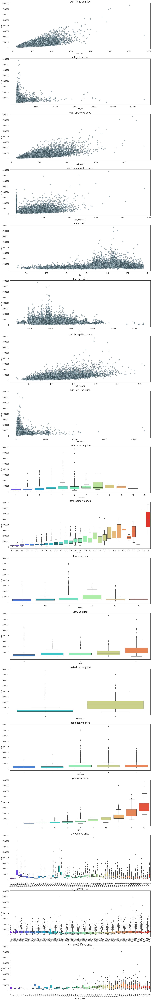

In [10]:
to_plot = [
    "sqft_living", "sqft_lot", "sqft_above", "sqft_basement", "lat", "long",
    "sqft_living15", "sqft_lot15", "bedrooms", "bathrooms", "floors", "view",
    "waterfront", "condition", "grade", "zipcode", "yr_built", "yr_renovated"
]

fig = plt.figure(figsize=(25, len(to_plot)*10))
for i, col in enumerate(to_plot):
    ax = fig.add_subplot(len(to_plot), 1, i + 1)
    if col in [
            "sqft_living", "sqft_lot", "sqft_above", "sqft_basement", "lat",
            "long", "sqft_living15", "sqft_lot15"
    ]:
        sns.scatterplot(x=col, y="price", data=df_plot, ax=ax, alpha=0.5, s=100)
    else:
        sns.boxplot(x=col, y="price", data=df_plot, ax=ax, palette="rainbow")
    if col in ["zipcode", "yr_built", "yr_renovated"]:
        plt.xticks(rotation=65)
    plt.title("{} vs price".format(col), fontsize=25)
    plt.show

##### Findings:  
* There are extremely high-valued properties with huge floor area.
* There are big lots at low value and vice versa.
* There is a property with 33 bedrooms.
* Ratio between bathroom and bedroom needs be checked.
* Most of the high-valued properties have 2-2.5 floors.
* There are high-valued properties with no waterfront view.
* Most of the high-valued properties have condition of 3 and 4.
* High-valued properties are in zipcodes 98004 and between 98033 to 98040.
* There are high-valued properties properties built in the 1910's, 1930's and between 1990 and 2010
* There are high-valued properties properties that were not renovated or that have no information regarding renovation.

# Exploratory Data Analysis

In this section we will address the null values under ***yr_renovated, waterfront, view*** and ***sqft_basement***.

The following columns with be added for EDA purposes:
* ***age_sold*** age at the time of acquisition
* ***age_renovation*** age at the time of renovation
* ***zipcode_name*** name of the city that corresponds to the zipcode
* min, max, mean, median, mode of ***price, bedrooms, bathrooms, floors, sqft_living, sqft_lot, grade, condition*** per zipcode


In [11]:
# Add a column for yr_sold
df["yr_sold"] = df.date.dt.year

# Use yr_built for yr_renovated = np.nan and 0
def proxy_renovated(x):
    if (x["yr_renovated"] == 0) | (np.isnan(x["yr_renovated"])):
        return int(x["yr_built"])
    else:
        return int(x["yr_renovated"])
df["yr_renovated_"] = df.apply(lambda x: proxy_renovated(x), axis=1)

# Add age_sold and age_renovated
df["age_sold"] = df.yr_sold - df.yr_built
df["age_renovated"] = df.yr_renovated_ - df.yr_built

df[[
    "date", "yr_sold", "yr_built", "yr_renovated", "yr_renovated_", "age_sold",
    "age_renovated"
]]

,date,yr_sold,yr_built,yr_renovated,yr_renovated_,age_sold,age_renovated
0,2014-10-13,2014,1955,0.0,1955,59,0
1,2014-12-09,2014,1951,1991.0,1991,63,40
2,2015-02-25,2015,1933,NaN,1933,82,0
3,2014-12-09,2014,1965,0.0,1965,49,0
4,2015-02-18,2015,1987,0.0,1987,28,0
...,...,...,...,...,...,...,...
21592,2014-05-21,2014,2009,0.0,2009,5,0
21593,2015-02-23,2015,2014,0.0,2014,1,0
21594,2014-06-23,2014,2009,0.0,2009,5,0
21595,2015-01-16,2015,2004,0.0,2004,11,0


We will create a table of zipcodes so we can analyse prices, floor/lot area, grade and condition per zipcode.

In [12]:
# zipcode_list = df.zipcode.unique()
# zipcodes = pre.get_zipcodes(zipcode_list, df)
zipcodes= pickle.load(open("zipcodes.pkl", "rb"))
zipcodes.head(10)

,zipcode,zipcode_name,coordinates,property_count,price_max,price_min,price_mean,price_median,price_mode,grade_max,grade_min,grade_mean,grade_median,grade_mode,condition_max,condition_min,condition_mean,condition_median,condition_mode,sqft_living_max,sqft_living_min,sqft_living_mean,sqft_living_median,sqft_living_mode,sqft_lot_max,sqft_lot_min,sqft_lot_mean,sqft_lot_median,sqft_lot_mode,bedrooms_max,bedrooms_min,bedrooms_mean,bedrooms_median,bedrooms_mode,bathrooms_max,bathrooms_min,bathrooms_mean,bathrooms_median,bathrooms_mode,floors_max,floors_min,floors_mean,floors_median,floors_mode
0,98178,Seattle,"[47.49641037, -122.25048065]",262,1700000.0,90000.0,310612.755725,278277.0,200000.0,10,5,6,7,7,5,2,3,3,3,4940.0,580.0,1729.351145,1725.0,860.0,67953.0,3000.0,8309.122137,7200.0,6000.0,6.0,1.0,3.305344,3.0,3.0,3.75,0.75,1.731870,1.75,1.0,3.0,1.0,1.185115,1.0,1.0
1,98125,Seattle,"[47.71675873, -122.30219269]",409,2050000.0,175000.0,469928.767726,425000.0,375000.0,10,5,7,7,7,5,2,3,3,3,4500.0,620.0,1746.278729,1600.0,1430.0,37200.0,825.0,7687.704156,7500.0,7200.0,7.0,1.0,3.210269,3.0,3.0,4.50,0.75,1.819682,1.75,1.0,3.0,1.0,1.372861,1.0,1.0
2,98028,Kenmore,"[47.75434113, -122.2457962]",283,1600000.0,160000.0,462488.869258,445000.0,400000.0,10,5,7,7,7,5,1,3,3,3,4400.0,720.0,2122.724382,2070.0,1830.0,117612.0,1116.0,11935.374558,9848.0,9600.0,6.0,2.0,3.480565,3.0,3.0,4.75,0.75,2.143110,2.25,2.5,2.5,1.0,1.420495,1.0,1.0
3,98136,Seattle,"[47.53646851, -122.3924408]",263,2230000.0,200000.0,551768.520913,489950.0,400000.0,10,4,7,7,7,5,1,3,3,3,5210.0,420.0,1726.828897,1590.0,1350.0,37500.0,700.0,5982.319392,5460.0,6000.0,6.0,1.0,2.931559,3.0,3.0,3.75,1.00,1.865019,1.75,1.0,3.0,1.0,1.475285,1.0,1.0
4,98074,Sammamish,"[47.62905884, -122.03450012]",441,3080000.0,280000.0,685675.843537,642000.0,550000.0,12,4,8,9,9,5,2,3,3,3,6160.0,530.0,2645.870748,2520.0,1010.0,284011.0,2839.0,14522.244898,10012.0,7500.0,6.0,1.0,3.625850,4.0,4.0,5.25,0.75,2.500000,2.50,2.5,3.0,1.0,1.713152,2.0,2.0
5,98053,Redmond,"[47.65056992, -122.01596069]",403,2280000.0,170000.0,677215.034739,635000.0,635000.0,12,6,8,8,8,5,2,3,3,3,13540.0,530.0,2620.238213,2450.0,1690.0,453895.0,2482.0,35596.585608,8561.0,4500.0,7.0,1.0,3.225806,3.0,4.0,8.00,1.00,2.460298,2.50,2.5,3.0,1.0,1.658809,2.0,2.0
6,98003,Federal Way,"[47.3077507, -122.31434631]",280,950000.0,128000.0,294111.278571,267475.0,225000.0,11,6,7,7,7,5,2,3,3,3,5774.0,760.0,1928.882143,1780.0,1300.0,79279.0,1302.0,10603.096429,8816.0,7350.0,6.0,1.0,3.357143,3.0,3.0,5.00,1.00,2.047321,2.00,2.5,2.0,1.0,1.310714,1.0,1.0
7,98198,Seattle,"[47.39825058, -122.31224823]",280,1350000.0,95000.0,302896.739286,265000.0,210000.0,11,4,7,7,7,5,2,3,3,3,5370.0,620.0,1745.360714,1610.0,2050.0,137214.0,1950.0,10525.978571,8589.5,7500.0,6.0,1.0,3.182143,3.0,3.0,3.50,0.75,1.788393,1.75,1.0,2.0,1.0,1.225000,1.0,1.0
8,98146,Seattle,"[47.49946976, -122.36367035]",288,1410000.0,82000.0,359496.260417,305000.0,210000.0,10,4,6,7,7,5,1,3,3,3,3810.0,410.0,1621.451389,1490.0,860.0,54160.0,2500.0,9020.243056,8100.0,5000.0,6.0,1.0,3.125000,3.0,3.0,3.75,0.75,1.633681,1.50,1.0,2.0,1.0,1.222222,1.0,1.0
9,98038,Maple Valley,"[47.40248871, -122.02848053]",589,1350000.0,110000.0,367091.483871,342000.0,275000.0,11,5,7,7,7,5,3,3,3,3,5230.0,670.0,2148.288625,2000.0,2800.0,623779.0,2132.0,25419.129032,6908.0,4200.0,5.0,1.0,3.441426,3.0,3.0,5.00,1.00,2.375637,2.50,2.5,2.5,1.0,1.740238,2.0,2.0


In [16]:
# pickle.dump(zipcodes, open("zipcodes.pkl", "wb"))

In [13]:
df = pd.merge(df, zipcodes, on="zipcode")
df.drop(["property_count"], axis=1, inplace=True)
df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,yr_sold,yr_renovated_,age_sold,age_renovated,zipcode_name,coordinates,price_max,price_min,price_mean,price_median,price_mode,grade_max,grade_min,grade_mean,grade_median,grade_mode,condition_max,condition_min,condition_mean,condition_median,condition_mode,sqft_living_max,sqft_living_min,sqft_living_mean,sqft_living_median,sqft_living_mode,sqft_lot_max,sqft_lot_min,sqft_lot_mean,sqft_lot_median,sqft_lot_mode,bedrooms_max,bedrooms_min,bedrooms_mean,bedrooms_median,bedrooms_mode,bathrooms_max,bathrooms_min,bathrooms_mean,bathrooms_median,bathrooms_mode,floors_max,floors_min,floors_mean,floors_median,floors_mode
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650,2014,1955,59,0,Seattle,"[47.49641037, -122.25048065]",1700000.0,90000.0,3.106128e+05,278277.0,200000.0,10,5,6,7,7,5,2,3,3,3,4940.0,580.0,1729.351145,1725.0,860.0,67953.0,3000.0,8309.122137,7200.0,6000.0,6.0,1.0,3.305344,3.0,3.0,3.75,0.75,1.73187,1.75,1.00,3.0,1.0,1.185115,1.0,1.0
1,4060000240,2014-06-23,205425.0,2,1.00,880,6780,1.0,0.0,0.0,4,6,880,0.0,1945,0.0,98178,47.5009,-122.248,1190,6780,2014,1945,69,0,Seattle,"[47.49641037, -122.25048065]",1700000.0,90000.0,3.106128e+05,278277.0,200000.0,10,5,6,7,7,5,2,3,3,3,4940.0,580.0,1729.351145,1725.0,860.0,67953.0,3000.0,8309.122137,7200.0,6000.0,6.0,1.0,3.305344,3.0,3.0,3.75,0.75,1.73187,1.75,1.00,3.0,1.0,1.185115,1.0,1.0
2,4058801670,2014-07-17,445000.0,3,2.25,2100,8201,1.0,NaN,2.0,3,8,1620,480.0,1967,0.0,98178,47.5091,-122.244,2660,8712,2014,1967,47,0,Seattle,"[47.49641037, -122.25048065]",1700000.0,90000.0,3.106128e+05,278277.0,200000.0,10,5,6,7,7,5,2,3,3,3,4940.0,580.0,1729.351145,1725.0,860.0,67953.0,3000.0,8309.122137,7200.0,6000.0,6.0,1.0,3.305344,3.0,3.0,3.75,0.75,1.73187,1.75,1.00,3.0,1.0,1.185115,1.0,1.0
3,2976800796,2014-09-25,236000.0,3,1.00,1300,5898,1.0,NaN,0.0,3,7,1300,0.0,1961,NaN,98178,47.5053,-122.255,1320,7619,2014,1961,53,0,Seattle,"[47.49641037, -122.25048065]",1700000.0,90000.0,3.106128e+05,278277.0,200000.0,10,5,6,7,7,5,2,3,3,3,4940.0,580.0,1729.351145,1725.0,860.0,67953.0,3000.0,8309.122137,7200.0,6000.0,6.0,1.0,3.305344,3.0,3.0,3.75,0.75,1.73187,1.75,1.00,3.0,1.0,1.185115,1.0,1.0
4,6874200960,2015-02-27,170000.0,2,1.00,860,5265,1.0,0.0,0.0,3,6,860,0.0,1931,0.0,98178,47.5048,-122.272,1650,8775,2015,1931,84,0,Seattle,"[47.49641037, -122.25048065]",1700000.0,90000.0,3.106128e+05,278277.0,200000.0,10,5,6,7,7,5,2,3,3,3,4940.0,580.0,1729.351145,1725.0,860.0,67953.0,3000.0,8309.122137,7200.0,6000.0,6.0,1.0,3.305344,3.0,3.0,3.75,0.75,1.73187,1.75,1.00,3.0,1.0,1.185115,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,2525049086,2014-10-03,2720000.0,4,3.25,3990,18115,2.0,0.0,0.0,4,11,3990,0.0,1989,NaN,98039,47.6177,-122.229,3450,16087,2014,1989,25,0,Medina,"[47.6271019, -122.23061371]",6890000.0,787500.0,2.161300e+06,1895000.0,1880000.0,13,7,9,9,9,5,3,3,3,3,9890.0,1220.0,3800.900000,3560.0,1220.0,35069.0,6572.0,17403.560000,17188.5,8119.0,7.0,2.0,4.060000,4.0,4.0,7.75,1.00,3.20000,3.00,2.25,2.0,1.0,1.560000,2.0,2.0
21593,2525049113,2014-07-25,1950000.0,4,3.50,4065,18713,2.0,0.0,0.0,4,10,4065,0.0,1987,0.0,98039,47.6209,-122.237,3070,18713,2014,1987,27,0,Medina,"[47.6271019, -122.23061371]",6890000.0,787500.0,2.161300e+06,1895000.0,1880000.0,13,7,9,9,9,5,3,3,3,3,9890.0,1220.0,3800.900000,3560.0,1220.0,35069.0,6572.0,17403.560000,17188.5,8119.0,7.0,2.0,4.060000,4.0,4.0,7.75,1.00,3.20000,3.00,2.25,2.0,1.0,1.560000,2.0,2.0
21594,3262300485,2015-04-21,2250000.0,5,5.25,3410,8118,2.0,NaN,0.0,3,11,3410,0.0,2006,0.0,98039,47.6295,-122.236,3410,16

We will assume all null values under ***waterfront*** are properties with no waterfront view.

In [14]:
df["waterfront_"] = df.waterfront.map(lambda x: 1 if x == 1 else 0)
display(df.waterfront.value_counts())
display(df.waterfront_.value_counts())

0.0    19075
1.0    146  
Name: waterfront, dtype: int64

0    21451
1    146  
Name: waterfront_, dtype: int64

We will use 0 as proxy for null values under ***view***.

In [15]:
df["view_"] = df.view.map(lambda x: x if x > 0 else 0)
display(df.view.value_counts())
display(df.view_.value_counts())

0.0    19422
2.0    957  
3.0    508  
1.0    330  
4.0    317  
Name: view, dtype: int64

0.0    19485
2.0    957  
3.0    508  
1.0    330  
4.0    317  
Name: view_, dtype: int64

We will address the null values under ***sqft_basement***.  We will check if this is the difference between ***sqft_living*** and ***sqft_above***.

In [16]:
df_plot = df.fillna("X")
df_plot["sqft_basement_"] = df_plot["sqft_living"] - df_plot["sqft_above"]
df_plot["check_basement"] = (df_plot["sqft_basement_"] == df_plot["sqft_basement"])

In [17]:
# Check if there are False under check_basement

df_plot.check_basement.value_counts()

True     21143
False    454  
Name: check_basement, dtype: int64

In [18]:
# Check the sqft_basement values of these 454 False entries

df_plot.query("check_basement == False").sqft_basement.value_counts()

X    454
Name: sqft_basement, dtype: int64

In [19]:
# These are all the entries with null values under sqft_basement.  We can then replace the nulls with 
# the difference between sqft_living and sqft_above.

df["sqft_basement_"] = df["sqft_living"] - df["sqft_above"]

In [20]:
df = df[[
    "price", "id", "date", "yr_sold", "yr_built", "yr_renovated_", "age_sold",
    "age_renovated", "bedrooms", "bathrooms", "sqft_living", "sqft_lot",
    "sqft_above", "sqft_basement_", "floors", "waterfront_", "view_",
    "condition", "grade", "sqft_living15", "sqft_lot15", "zipcode",
    "zipcode_name", "lat", "long", "coordinates", "price_max", "price_min",
    "price_mean", "price_median", "price_mode", "grade_max", "grade_min",
    "grade_mean", "grade_median", "grade_mode", "condition_max",
    "condition_min", "condition_mean", "condition_median", "condition_mode",
    "sqft_living_max", "sqft_living_min", "sqft_living_mean",
    "sqft_living_median", "sqft_living_mode", "sqft_lot_max", "sqft_lot_min",
    "sqft_lot_mean", "sqft_lot_median", "sqft_lot_mode", "bedrooms_max",
    "bedrooms_min", "bedrooms_mean", "bedrooms_median", "bedrooms_mode",
    "bathrooms_max", "bathrooms_min", "bathrooms_mean", "bathrooms_median",
    "bathrooms_mode", "floors_max", "floors_min", "floors_mean",
    "floors_median", "floors_mode", "yr_renovated", "waterfront", "view",
    "sqft_basement"
]]
df.isna().sum()

price                 0   
id                    0   
date                  0   
yr_sold               0   
yr_built              0   
yr_renovated_         0   
age_sold              0   
age_renovated         0   
bedrooms              0   
bathrooms             0   
sqft_living           0   
sqft_lot              0   
sqft_above            0   
sqft_basement_        0   
floors                0   
waterfront_           0   
view_                 0   
condition             0   
grade                 0   
sqft_living15         0   
sqft_lot15            0   
zipcode               0   
zipcode_name          0   
lat                   0   
long                  0   
coordinates           0   
price_max             0   
price_min             0   
price_mean            0   
price_median          0   
price_mode            0   
grade_max             0   
grade_min             0   
grade_mean            0   
grade_median          0   
grade_mode            0   
condition_max         0   
c

## yr_sold, yr_built, yr_renovated

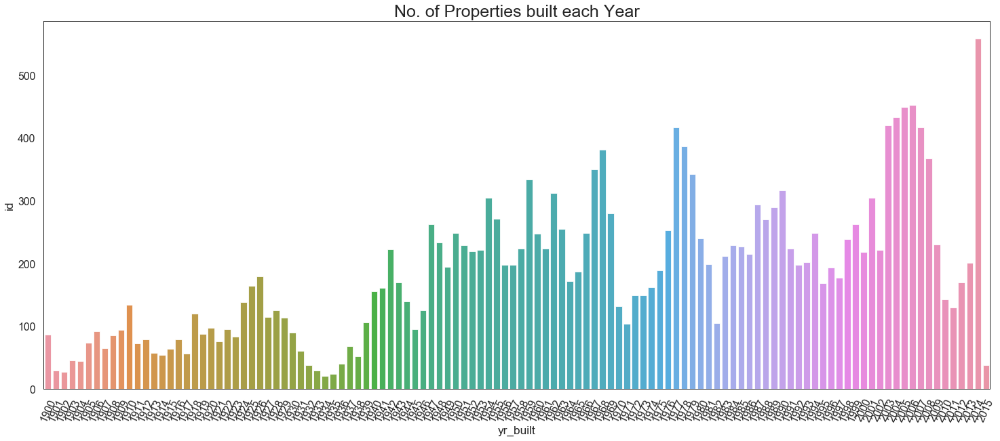

In [21]:
plt.figure(figsize=(25,10))
sns.barplot(x = "yr_built", y="id", data = df.groupby("yr_built").count().reset_index());
plt.title("No. of Properties built each Year", fontsize=25);
plt.xticks(rotation=65)
plt.show;

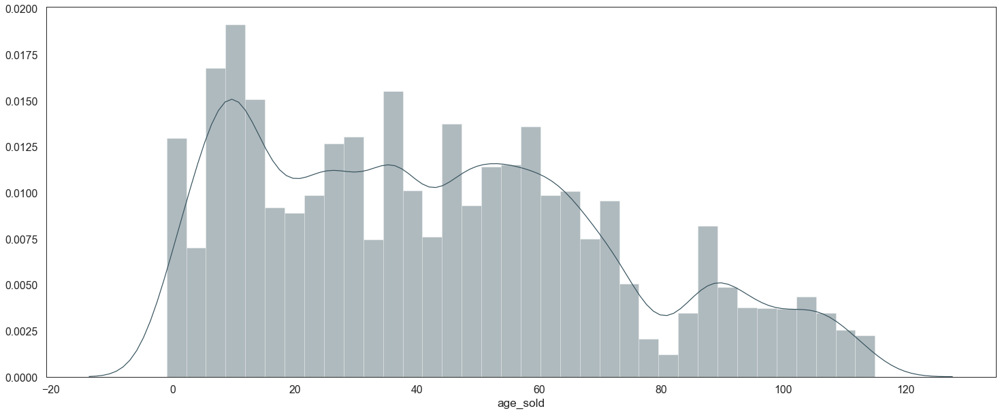

In [22]:
plt.figure(figsize=(25,10))
sns.distplot(df.age_sold);
plt.show;

In [23]:
# Check properties with age sold < 0
df.query("age_sold < 0")[[
    "date", "yr_sold", "yr_built", "yr_renovated_", "age_sold"
]]

,date,yr_sold,yr_built,yr_renovated_,age_sold
5585,2014-07-09,2014,2015,2015,-1
5600,2014-11-25,2014,2015,2015,-1
6309,2014-08-28,2014,2015,2015,-1
6353,2014-06-25,2014,2015,2015,-1
7394,2014-05-20,2014,2015,2015,-1
13098,2014-06-17,2014,2015,2015,-1
13134,2014-08-01,2014,2015,2015,-1
13208,2014-10-29,2014,2015,2015,-1
13286,2014-06-24,2014,2015,2015,-1
13494,2014-07-31,2014,2015,2015,-1


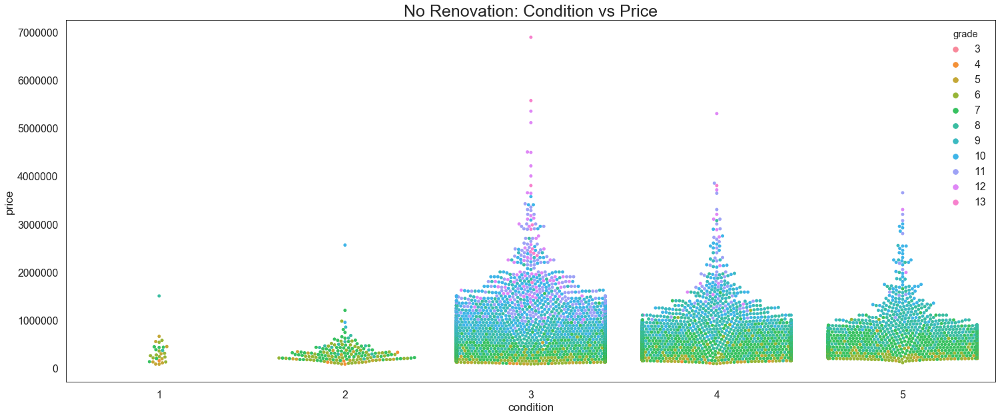

In [72]:
#Let's look at the properties that were never renovated
plt.figure(figsize=(25,10))
sns.swarmplot(x = "condition", y = "price", data = df.query("age_renovated == 0"), hue="grade");
plt.title("No Renovation: Condition vs Price", fontsize=25);
plt.show;

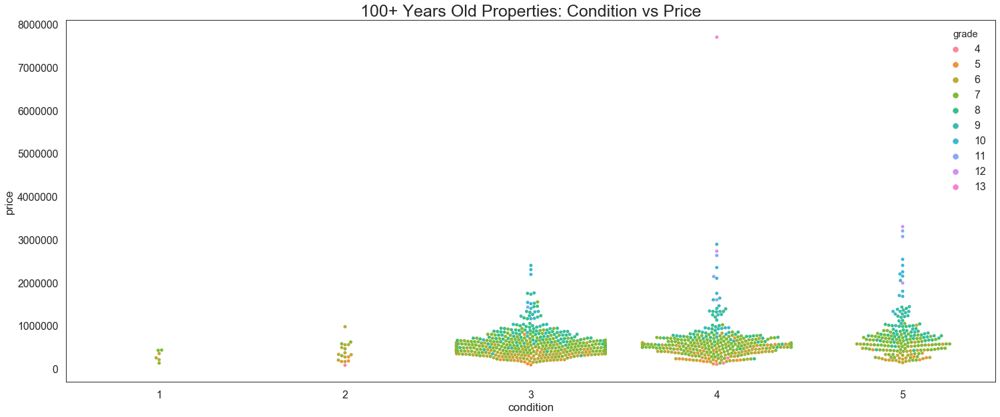

In [24]:
#Let's look at the properties that are at least 100 years old at the time of the acquisition
plt.figure(figsize=(25,10))
sns.swarmplot(x = "condition", y = "price", data = df.query("age_sold > 100"), hue="grade");
plt.title("100+ Years Old Properties: Condition vs Price", fontsize=25);
plt.show;

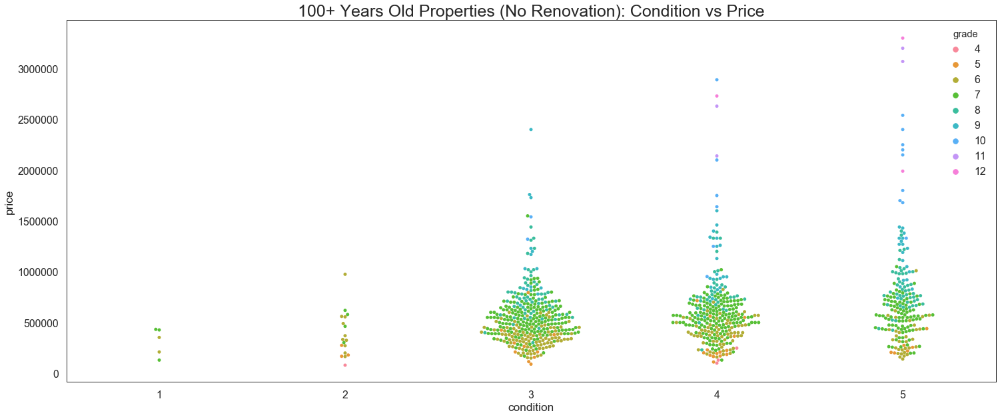

In [25]:
#Let's look at the unrenovated properties that are at least 100 years old at the time of the acquisition
plt.figure(figsize=(25,10))
sns.swarmplot(x = "condition", y = "price", data = df.query("age_sold > 100 & age_renovated==0"), hue="grade");
plt.title("100+ Years Old Properties (No Renovation): Condition vs Price", fontsize=25);
plt.show;

In [26]:
df.query("grade == 12 & condition ==5 & age_renovated == 0")

,price,id,date,yr_sold,yr_built,yr_renovated_,age_sold,age_renovated,bedrooms,bathrooms,sqft_living,sqft_lot,sqft_above,sqft_basement_,floors,waterfront_,view_,condition,grade,sqft_living15,sqft_lot15,zipcode,zipcode_name,lat,long,coordinates,price_max,price_min,price_mean,price_median,price_mode,grade_max,grade_min,grade_mean,grade_median,grade_mode,condition_max,condition_min,condition_mean,condition_median,condition_mode,sqft_living_max,sqft_living_min,sqft_living_mean,sqft_living_median,sqft_living_mode,sqft_lot_max,sqft_lot_min,sqft_lot_mean,sqft_lot_median,sqft_lot_mode,bedrooms_max,bedrooms_min,bedrooms_mean,bedrooms_median,bedrooms_mode,bathrooms_max,bathrooms_min,bathrooms_mean,bathrooms_median,bathrooms_mode,floors_max,floors_min,floors_mean,floors_median,floors_mode,yr_renovated,waterfront,view,sqft_basement
7628,1990000.0,1346300035,2014-06-26,2014,1902,1902,112,0,5,3.0,4480,5000,3420,1060,2.5,0,0.0,5,12,3220,5600,98112,Seattle,47.6275,-122.315,"[47.62921143, -122.29640198]",3400000.0,169317.0,1.096239e+06,915000.0,1050000.0,12,6,8,8,8,5,1,3,3,3,7710.0,700.0,2498.743494,2330.0,2350.0,30120.0,520.0,4990.431227,4426.0,4000.0,8.0,1.0,3.509294,3.0,3.0,4.75,0.75,2.373606,2.25,2.5,3.5,1.0,1.806691,2.0,2.0,0.0,0.0,0.0,1060.0
7636,3300000.0,1346300150,2014-10-20,2014,1904,1904,110,0,8,4.0,7710,11750,6090,1620,3.5,0,0.0,5,12,4210,8325,98112,Seattle,47.6263,-122.314,"[47.62921143, -122.29640198]",3400000.0,169317.0,1.096239e+06,915000.0,1050000.0,12,6,8,8,8,5,1,3,3,3,7710.0,700.0,2498.743494,2330.0,2350.0,30120.0,520.0,4990.431227,4426.0,4000.0,8.0,1.0,3.509294,3.0,3.0,4.75,0.75,2.373606,2.25,2.5,3.5,1.0,1.806691,2.0,2.0,0.0,0.0,0.0,1620.0


In [55]:
for i in list(df_plot.index):
    idx = df_plot.id.loc[i]
    df_plot.at[i, "resold"] = df_plot.query("id == @idx").id.count()
    
df_plot[df_plot.duplicated("id", keep=False)].resold.value_counts()

2.0    350
3.0    3  
Name: resold, dtype: int64

In [156]:
df_plot.query("resold==3")

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,yr_sold,yr_renovated_,age_sold,age_renovated,zipcode_name,coordinates,price_max,price_min,price_mean,price_median,price_mode,grade_max,grade_min,grade_mean,grade_median,grade_mode,condition_max,condition_min,condition_mean,condition_median,condition_mode,sqft_living_max,sqft_living_min,sqft_living_mean,sqft_living_median,sqft_living_mode,sqft_lot_max,sqft_lot_min,sqft_lot_mean,sqft_lot_median,sqft_lot_mode,bedrooms_max,bedrooms_min,bedrooms_mean,bedrooms_median,bedrooms_mode,bathrooms_max,bathrooms_min,bathrooms_mean,bathrooms_median,bathrooms_mode,floors_max,floors_min,floors_mean,floors_median,floors_mode,waterfront_,view_,sqft_basement_,check_basement,resold,bed_bath_ratio
17225,795000620,2014-12-15,124000.0,3,1.0,1080,6250,1.0,0,0,2,5,1080,0,1950,0,98168,47.5045,-122.33,1070,6250,2014,1950,64,0,Seattle,"[47.489151, -122.29284668]",600000.0,78000.0,240328.371747,235000.0,235000.0,10,5,6,7,7,5,1,3,3,3,4440.0,380.0,1468.624535,1380.0,1370.0,49658.0,2250.0,11269.843866,8867.0,6600.0,5.0,1.0,2.996283,3.0,3.0,4.5,0.75,1.433086,1.0,1.0,2.0,1.0,1.159851,1.0,1.0,0,0.0,0,True,3.0,0.333333
17224,795000620,2014-09-24,115000.0,3,1.0,1080,6250,1.0,0,0,2,5,1080,0,1950,0,98168,47.5045,-122.33,1070,6250,2014,1950,64,0,Seattle,"[47.489151, -122.29284668]",600000.0,78000.0,240328.371747,235000.0,235000.0,10,5,6,7,7,5,1,3,3,3,4440.0,380.0,1468.624535,1380.0,1370.0,49658.0,2250.0,11269.843866,8867.0,6600.0,5.0,1.0,2.996283,3.0,3.0,4.5,0.75,1.433086,1.0,1.0,2.0,1.0,1.159851,1.0,1.0,0,0.0,0,True,3.0,0.333333
17226,795000620,2015-03-11,157000.0,3,1.0,1080,6250,1.0,X,0,2,5,1080,0,1950,X,98168,47.5045,-122.33,1070,6250,2015,1950,65,0,Seattle,"[47.489151, -122.29284668]",600000.0,78000.0,240328.371747,235000.0,235000.0,10,5,6,7,7,5,1,3,3,3,4440.0,380.0,1468.624535,1380.0,1370.0,49658.0,2250.0,11269.843866,8867.0,6600.0,5.0,1.0,2.996283,3.0,3.0,4.5,0.75,1.433086,1.0,1.0,2.0,1.0,1.159851,1.0,1.0,0,0.0,0,True,3.0,0.333333


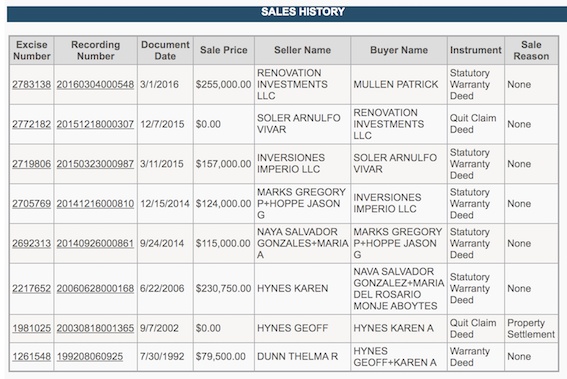

In [160]:
# Let's look at the sales history of id 0795000620
# https://blue.kingcounty.com/Assessor/eRealProperty/Detail.aspx?ParcelNbr=0795000620
pre.get_image("0795000620.png")

##### Findings:  
* Property construction increased after WWII.  It was down at the start 70's but picked up at the end of that decade. There was again an increase at the start of 2000's then dropped at the end of that decade. It peaked in 2014 with 559 new properties.
* There are 12 properties that were sold even before they were completed.  These can be properties sold at pre-selling stage.
* There are 20853 properties that were not renovated, most of which are in average to very good condition.
* Most of 100+ yr old properties are in average to very good condition and grade.
    - There are 2 100+ yr old unrenovated properties with condition = 5 and grade = 12.
    - One outlier sold at $7.7mm was built in 1910 and renovated in 1987.
* There were 176 properties resold.
    - id 0795000620 was sold 3x within a year, 4x within 2 years

## zipcode, lat, long

In [56]:
df[["id", "price", "date", "zipcode_name", "zipcode"]].sort_values("price", ascending=False).iloc[:10,:]

,id,price,date,zipcode_name,zipcode
16536,6762700020,7700000.0,2014-10-13,Seattle,98102
13576,9808700762,7060000.0,2014-06-11,Bellevue,98004
21560,9208900037,6890000.0,2014-09-19,Medina,98039
21552,2470100110,5570000.0,2014-08-04,Medina,98039
13533,8907500070,5350000.0,2015-04-13,Bellevue,98004
6345,7558700030,5300000.0,2015-04-13,Mercer Island,98040
19005,1247600105,5110000.0,2014-10-20,Kirkland,98033
6441,1924059029,4670000.0,2014-06-17,Mercer Island,98040
19470,7738500731,4500000.0,2014-08-15,Seattle,98155
13643,3835500195,4490000.0,2014-06-18,Bellevue,98004


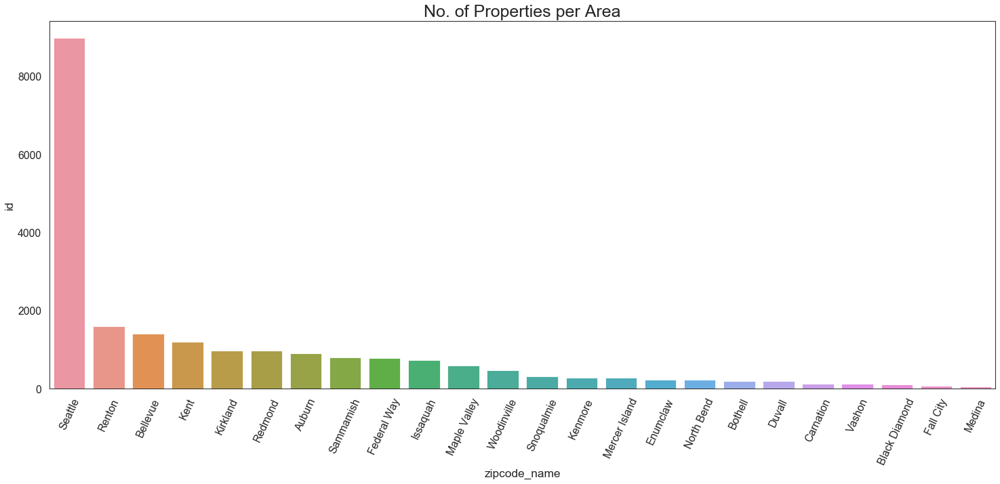

In [57]:
plt.figure(figsize=(25,10))
sns.barplot(x = "zipcode_name", y = "id", data = df.groupby(["zipcode_name"]).count().sort_values("id", ascending=False).reset_index());
plt.title("No. of Properties per Area", fontsize=25);
plt.xticks(rotation=65);
plt.show;

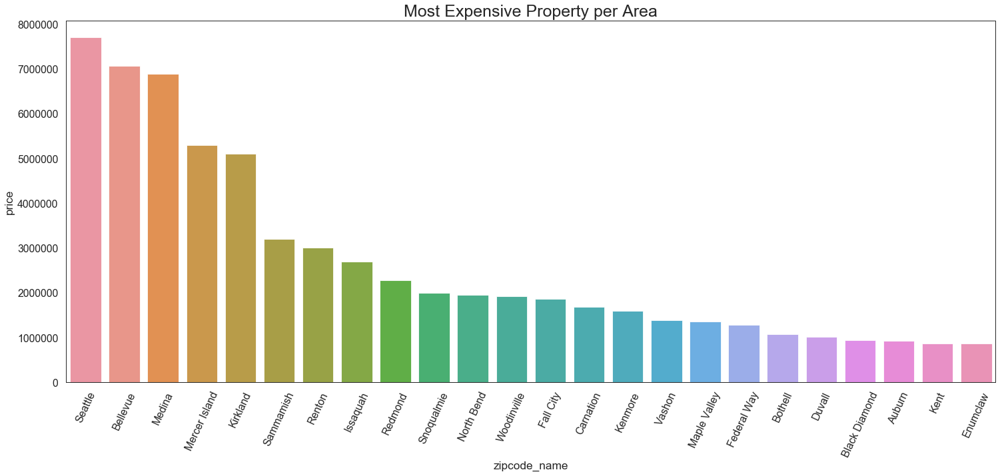

In [58]:
plt.figure(figsize=(25,10))
sns.barplot(x = "zipcode_name", y = "price", data = df.groupby(["zipcode_name"]).max().sort_values("price", ascending=False).reset_index());
plt.title("Most Expensive Property per Area", fontsize=25);
plt.xticks(rotation=65);
plt.show;

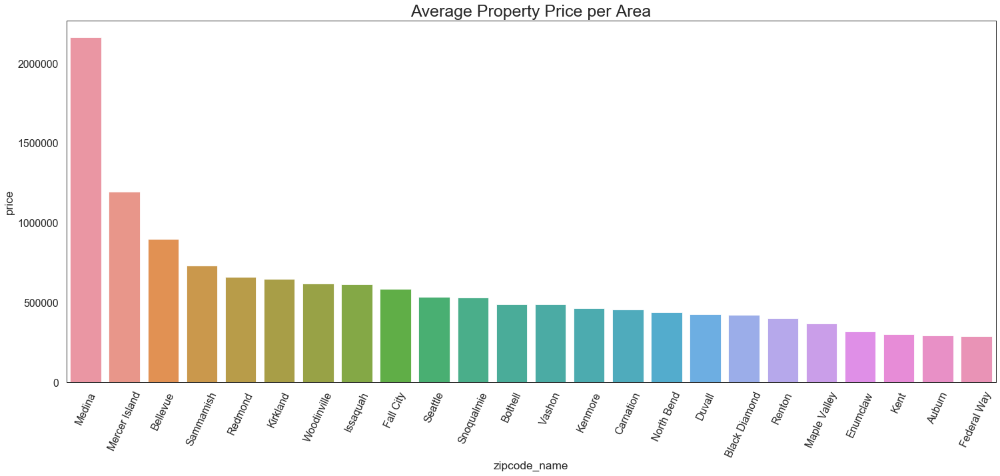

In [59]:
plt.figure(figsize=(25,10))
sns.barplot(x = "zipcode_name", y = "price", data = df.groupby(["zipcode_name"]).mean().sort_values("price", ascending=False).reset_index());
plt.title("Average Property Price per Area", fontsize=25);
plt.xticks(rotation=65);
plt.show;

In [60]:
#Let's plot each zipcode's coordinates.  The size of the circle corresponds to the average price per zipcode.

coord_list = zipcodes.coordinates.values.tolist()

zip_include = [
    "Seattle", "Bellevue", "Medina", "Mercer Island", "Renton", "Kent",
    "Kenmore", "Bothell", "Kirkland", "Redmond", "Woodinville", "Sammamish",
    "Vashon", "Federal Way", "Auburn", "Issaquah", "Maple Valley", "Black Diamond"
]

kc_map = folium.Map(location=[47.6, -122.2],
                    zoom_start=9.2, tiles="Cartodb Positron")

for point in range(len(coord_list)):
    folium.CircleMarker(
        coord_list[point],
        name="Average Price in each Zipcode",
        radius=zipcodes.price_mean.iloc[point]/80000,
        color='b',
        fill=True,
        fill_opacity=0.7,
        fill_color="green" if zipcodes.zipcode_name.iloc[point] in zip_include else "red",
        popup={
            "zipcode": int(zipcodes.zipcode.iloc[point]),
            "zipcode_name": zipcodes.zipcode_name.iloc[point],
            "# of properties": int(zipcodes.property_count.iloc[point]),
            "max price": round(zipcodes.price_max.iloc[point], 0),
            "min price": round(zipcodes.price_min.iloc[point], 0),
            "mean price": round(zipcodes.price_mean.iloc[point], 0),
            "mode price": round(zipcodes.price_mode.iloc[point], 0),
            "median price": round(zipcodes.price_median.iloc[point], 0)
        }).add_to(kc_map)

kc_map

In [61]:
kc_map = folium.Map(location=[47.6, -122.2], zoom_start=9.2)

HeatMap(data=df[["lat", "long", "price"]].values.tolist(),
        radius=8).add_to(kc_map)

kc_map

##### Findings:
* The most expensive properties are in zipcodes 98102 (Seattle), 98004 (Bellevue), 98039 (Medina) and 98040 (Mercer Island).
* The biggest improvements are in zipcodes 98053 (Redmond), 98102 (Seattle), 98004 (Bellevue), 98039 (Medina) and 98040 (Mercer Island).
* The biggest lots are in zipcodes 98022 (Enumclaw), 98014 (Carnation), 98027 (Issaquah), and 98045 (North Bend).
* ~9K listings are in Seattle.

## bedrooms

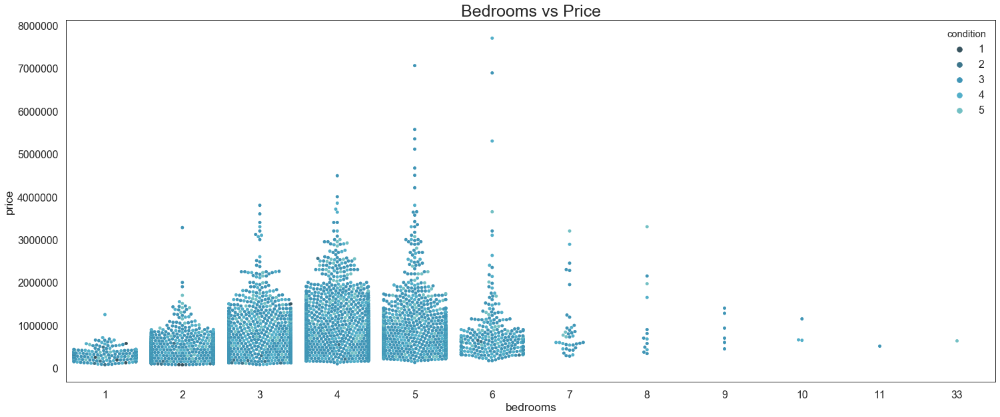

In [114]:
plt.figure(figsize=(25,10))
sns.swarmplot(x = "bedrooms", y = "price", data = df, hue="condition");
plt.title("Bedrooms vs Price", fontsize=25);
plt.show;

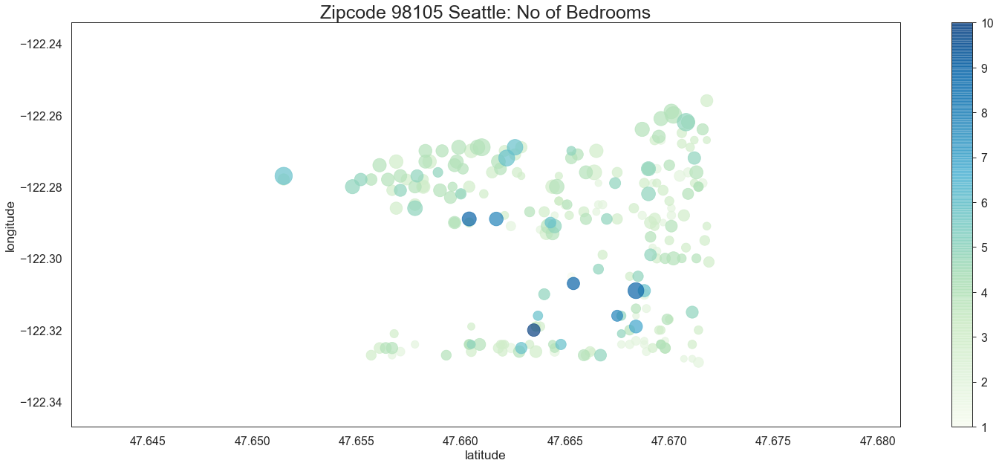

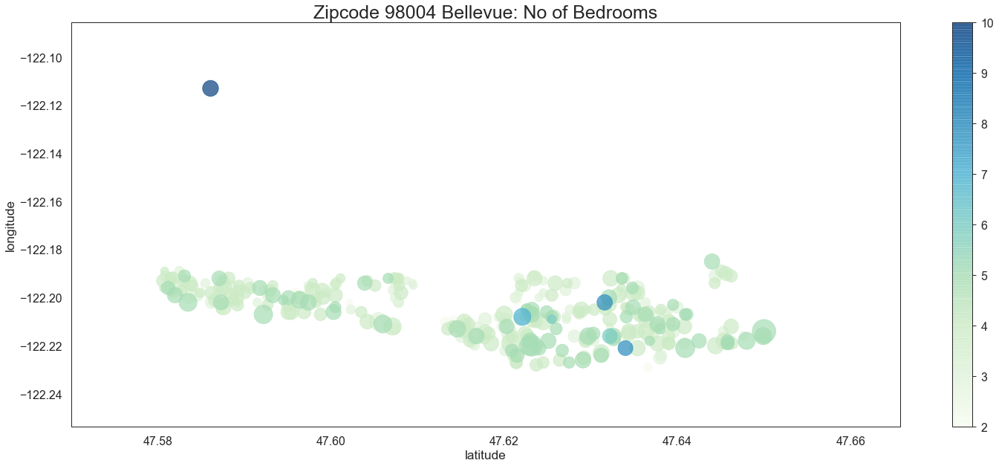

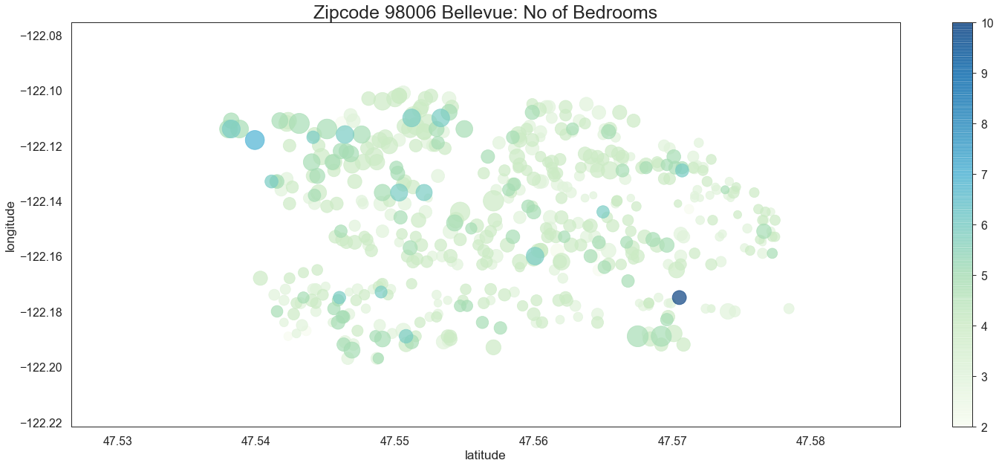

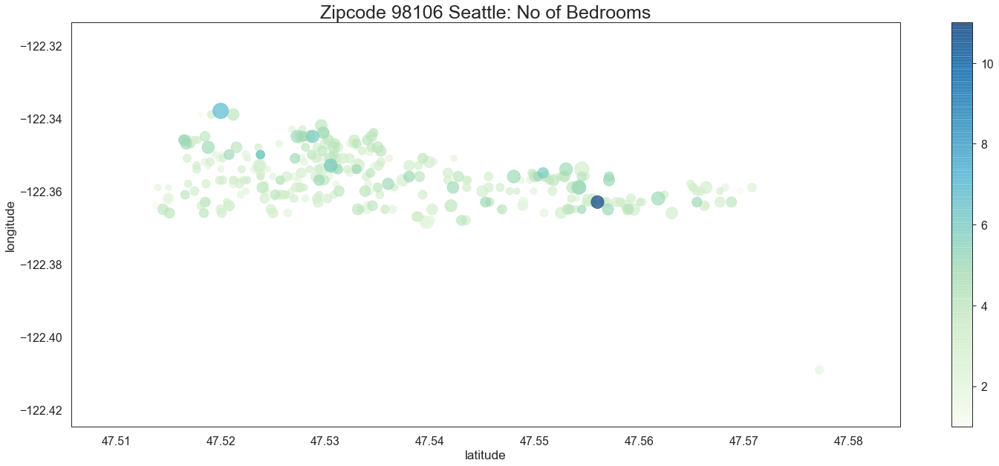

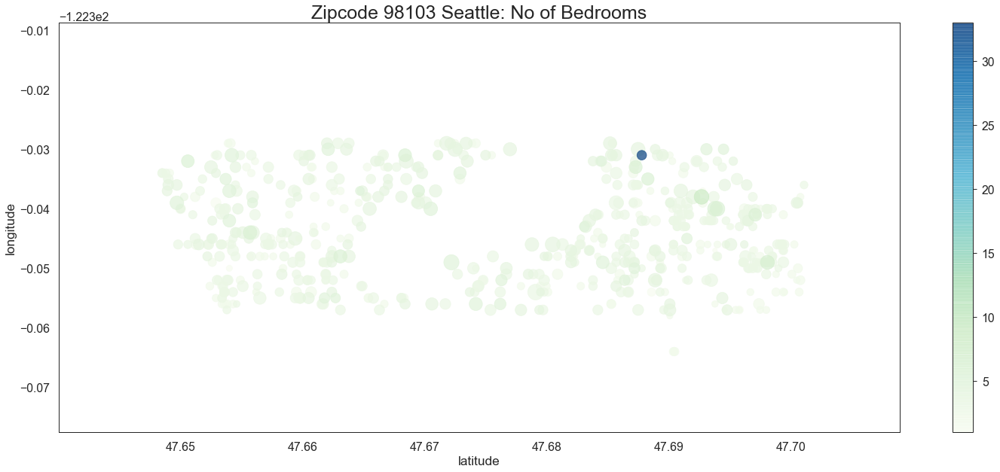

In [146]:
#Let's look at the zipcodes with >9 bedrooms.

zips = df_plot.query("bedrooms>9").zipcode.unique()
df_plot = df_plot.sort_values("bedrooms")

for zipx in zips:
    plt.figure(figsize=(25, 10))
    plt.scatter(x=df_plot.query("zipcode == @zipx").lat,
                y=df_plot.query("zipcode == @zipx").long,
                s=(df_plot.query("zipcode == @zipx").sqft_living)/10,
                alpha=0.7,
                c=df_plot.query("zipcode == @zipx").bedrooms,
                cmap="GnBu");
    plt.title("Zipcode {} {}: No of Bedrooms".format(zipx, df_plot.query("zipcode == @zipx").zipcode_name.iloc[0]), fontsize=25);
    plt.colorbar();
    plt.xlabel("latitude"); 
    plt.ylabel("longitude"); 
    plt.show;

In [127]:
df_plot.query("bedrooms>9")

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,yr_sold,yr_renovated_,age_sold,age_renovated,zipcode_name,coordinates,price_max,price_min,price_mean,price_median,price_mode,grade_max,grade_min,grade_mean,grade_median,grade_mode,condition_max,condition_min,condition_mean,condition_median,condition_mode,sqft_living_max,sqft_living_min,sqft_living_mean,sqft_living_median,sqft_living_mode,sqft_lot_max,sqft_lot_min,sqft_lot_mean,sqft_lot_median,sqft_lot_mode,bedrooms_max,bedrooms_min,bedrooms_mean,bedrooms_median,bedrooms_mode,bathrooms_max,bathrooms_min,bathrooms_mean,bathrooms_median,bathrooms_mode,floors_max,floors_min,floors_mean,floors_median,floors_mode,waterfront_,view_,sqft_basement_,check_basement,resold
11568,8812401450,2014-12-29,660000.0,10,3.00,2920,3745,2.0,0,0,4,7,1860,1060,1913,0,98105,47.6635,-122.320,1810,3745,2014,1913,101,0,Seattle,"[47.65879822, -122.29129028]",3650000.0,380000.0,8.632289e+05,675000.0,530000.0,12,6,7,8,7,5,2,3,3,3,5570.0,850.0,2150.576419,1910.0,1390.0,26211.0,736.0,5121.165939,4480.0,4000.0,10.0,1.0,3.580786,3.0,3.0,4.75,1.00,2.159389,2.00,1.75,3.5,1.0,1.591703,1.5,2.0,0,0.0,1060,True,1.0
13708,627300145,2014-08-14,1150000.0,10,5.25,4590,10920,1.0,0,2,3,9,2500,2090,2008,0,98004,47.5861,-122.113,2730,10400,2014,2008,6,0,Bellevue,"[47.61555099, -122.20639801]",7060000.0,425000.0,1.356524e+06,1150000.0,650000.0,13,6,8,9,8,5,1,3,3,3,10040.0,860.0,2909.022082,2660.0,2100.0,44384.0,779.0,13104.220820,11119.0,8113.0,10.0,2.0,3.854890,4.0,4.0,6.00,1.00,2.527603,2.50,2.50,3.0,1.0,1.432177,1.0,1.0,0,2.0,2090,True,1.0
18512,5566100170,2014-10-29,650000.0,10,2.00,3610,11914,2.0,0,0,4,7,3010,600,1958,0,98006,47.5705,-122.175,2040,11914,2014,1958,56,0,Bellevue,"[47.55295181, -122.14945221]",4210000.0,247500.0,8.599386e+05,760184.5,550000.0,13,6,8,9,8,5,1,3,4,3,8020.0,930.0,2888.295181,2720.0,2290.0,88909.0,1960.0,13383.435743,10447.5,8400.0,10.0,2.0,3.841365,4.0,4.0,6.25,0.75,2.555723,2.50,2.50,3.0,1.0,1.459839,1.0,1.0,0,0.0,600,True,1.0
20527,1773100755,2014-08-21,520000.0,11,3.00,3000,4960,2.0,0,0,3,7,2400,600,1918,1999,98106,47.5560,-122.363,1420,4960,2014,1999,96,81,Seattle,"[47.54795074, -122.35125732]",795000.0,90000.0,3.195814e+05,315000.0,325000.0,10,4,6,7,7,5,1,3,3,3,4340.0,500.0,1487.883582,1400.0,720.0,47743.0,572.0,5554.238806,5120.0,5000.0,11.0,1.0,3.101493,3.0,3.0,4.00,0.75,1.804478,1.75,1.00,3.0,1.0,1.382090,1.0,1.0,0,0.0,600,True,1.0
5423,2402100895,2014-06-25,640000.0,33,1.75,1620,6000,1.0,0,0,5,7,1040,580,1947,0,98103,47.6878,-122.331,1330,4700,2014,1947,67,0,Seattle,"[47.67070007, -122.34294891]",1700000.0,238000.0,5.850488e+05,550000.0,650000.0,11,5,7,7,7,5,1,3,3,3,4360.0,390.0,1650.830565,1505.0,1420.0,9450.0,651.0,3482.445183,3500.0,3000.0,33.0,1.0,3.059801,3.0,3.0,4.50,0.75,1.934801,2.00,1.00,3.5,1.0,1.827243,1.5,1.0,0,0.0,580,True,1.0


##### Findings:  
* The following seems to be outliers based on the sqft_living and bedrooms of the neighboring properties:
    - id 2402100895 with 33 bedrooms 
    - id 1773100755 with 11 bedrooms
    - id 5566100170 with 10 bedrooms
    - id 627300145 with 10 bedrooms
    

## bathrooms

In [147]:
df_plot["bed_bath_ratio"] = df_plot.bathrooms/df_plot.bedrooms

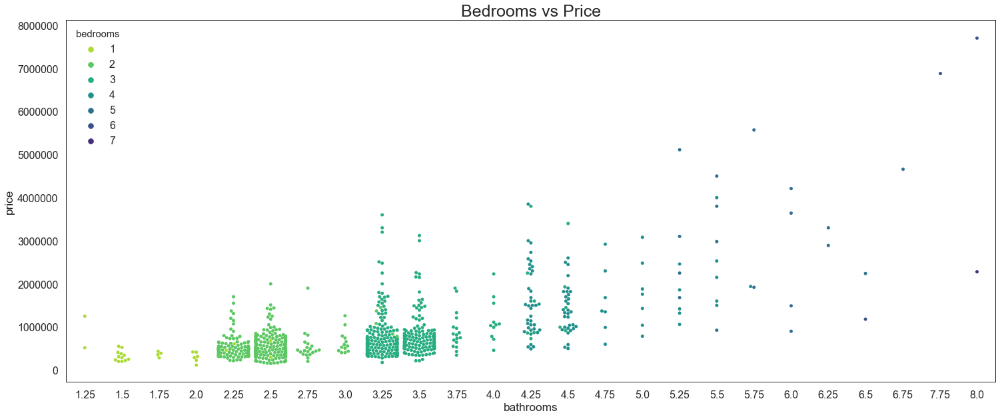

In [148]:
# Compare bathrooms and bedrooms and check if there are outliers caused by high number of bathrooms

plt.figure(figsize=(25,10))
sns.swarmplot(x = "bathrooms", y = "price", data = df_plot.query("bed_bath_ratio > 1"), hue="bedrooms", palette="viridis_r");
plt.title("Bedrooms vs Price", fontsize=25);
plt.show;

In [155]:
df_plot[[
    "id","bed_bath_ratio", "bathrooms", "bedrooms", "sqft_living", "sqft_living_max", "sqft_living15"
]].sort_values("bed_bath_ratio", ascending=False).head(30)

,id,bed_bath_ratio,bathrooms,bedrooms,sqft_living,sqft_living_max,sqft_living15
5150,4083304190,2.500,2.50,1,1820,4360.0,1860
21463,7461400360,2.500,2.50,1,1980,3990.0,1980
20851,3876313030,2.250,2.25,1,2140,5860.0,1980
19081,1720800305,2.250,2.25,1,1220,8010.0,3150
2131,537000130,2.250,2.25,1,2060,5774.0,2060
5958,6450304600,2.250,2.25,1,1940,3400.0,1580
21164,2025079033,2.000,2.00,1,3000,6530.0,2330
9849,4031000520,2.000,2.00,1,1150,5440.0,1200
16436,8835800480,2.000,2.00,1,1780,7420.0,1780
21402,7840800135,2.000,2.00,1,1240,3990.0,1030


##### Findings:
* There are a number of properties with more bathrooms than bedrooms.

## sqft_living, sqft_above, sqft_basement, floors

## sqft_lot

## waterfront

## view

## condition, grade

***condition***: Relative to age and grade. Coded 1-5.

1 = Poor- Worn out. Repair and overhaul needed on painted surfaces, roofing, plumbing, heating and numerous functional inadequacies. Excessive deferred maintenance and abuse, limited value-in-use, approaching abandonment or major reconstruction; reuse or change in occupancy is imminent. Effective age is near the end of the scale regardless of the actual chronological age.

2 = Fair- Badly worn. Much repair needed. Many items need refinishing or overhauling, deferred maintenance obvious, inadequate building utility and systems all shortening the life expectancy and increasing the effective age.

3 = Average- Some evidence of deferred maintenance and normal obsolescence with age in that a few minor repairs are needed, along with some refinishing. All major components still functional and contributing toward an extended life expectancy. Effective age and utility is standard for like properties of its class and usage.

4 = Good- No obvious maintenance required but neither is everything new. Appearance and utility are above the standard and the overall effective age will be lower than the typical property.

5= Very Good- All items well maintained, many having been overhauled and repaired as they have shown signs of wear, increasing the life expectancy and lowering the effective age with little deterioration or obsolescence evident with a high degree of utility.


***grade***: Represents the construction quality of improvements. Grades run from grade 1 to 13. Generally defined as:

1-3 Falls short of minimum building standards. Normally cabin or inferior structure.

4 Generally older, low quality construction. Does not meet code.

5 Low construction costs and workmanship. Small, simple design.

6 Lowest grade currently meeting building code. Low quality materials and simple designs.

7 Average grade of construction and design. Commonly seen in plats and older sub-divisions.

8 Just above average in construction and design. Usually better materials in both the exterior and interior finish work.

9 Better architectural design with extra interior and exterior design and quality.

10 Homes of this quality generally have high quality features. Finish work is better and more design quality is seen in the floor plans. Generally have a larger square footage.

11 Custom design and higher quality finish work with added amenities of solid woods, bathroom fixtures and more luxurious options.

12 Custom design and excellent builders. All materials are of the highest quality and all conveniences are present.

13 Generally custom designed and built. Mansion level. Large amount of highest quality cabinet work, wood trim, marble, entry ways etc.

## sqft_living15, sqft_lot15